In [1]:
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from elastic_nerf.utils import wandb_utils as wu
from elastic_nerf.utils import results_utils as ru
import pandas as pd
from dataclasses import asdict
import numpy as np
import scienceplots

plt.style.use(["science", "ieee"])

In [85]:
def make_df_for_run(
    weight_norms, grad_norms, config, model_type, steps, sweep_id, run_id
):
    results_all = []
    num_steps = 43
    num_widths = 64
    module_names = list(weight_norms.keys())
    flattened_config = wu.flatten_dict(asdict(config), sep=".")
    for step_idx in range(num_steps):
        base_width = 8
        for width_idx in range(num_widths):
            for module_name in module_names:
                try:
                    results = {
                        "step": steps[step_idx],
                        "width": width_idx + 1,
                        "module": module_name,
                        "sweep_id": sweep_id,
                        "run_id": run_id,
                        "model_type": model_type,
                    }
                    results.update(flattened_config)
                    for metric_type in [
                        "L1",
                        "Frobenius",
                        "Spectral (max)",
                        "Spectral (min)",
                    ]:
                        if (
                            len(weight_norms[module_name][metric_type]["1D"][step_idx])
                            < num_widths
                        ):
                            # If the module wasn't elastic, we don't compute the norms for it
                            weight = None
                            weight_scaled = None
                        else:
                            weight = weight_norms[module_name][metric_type]["1D"][
                                step_idx
                            ][width_idx]
                            base_weight = weight_norms[module_name][metric_type]["1D"][
                                step_idx
                            ][base_width - 1]

                            weight_scaled = (
                                weight / base_weight if base_weight > 0 else None
                            )

                        if (
                            step_idx == 0
                            or len(
                                grad_norms[module_name][metric_type]["1D"][step_idx - 1]
                            )
                            < num_widths
                        ):
                            grad = None
                            grad_scaled = None
                        else:
                            grad = grad_norms[module_name][metric_type]["1D"][
                                step_idx - 1
                            ][width_idx]
                            grad_base = grad_norms[module_name][metric_type]["1D"][
                                step_idx - 1
                            ][base_width - 1]
                            grad_scaled = grad / grad_base if grad_base > 0 else None
                        results.update(
                            {
                                f"weight/{metric_type}": weight,
                                f"weight_scaled/{metric_type}": weight_scaled,
                                f"grad/{metric_type}": grad,
                                f"grad_scaled/{metric_type}": grad_scaled,
                            }
                        )
                    results_all.append(results)
                except Exception as e:
                    print(
                        f"Encountered error at step {step_idx}, width {width_idx}, metric {metric_type} for {module_name}: {e}"
                    )
                    raise e

    return pd.DataFrame(results_all)

In [86]:
log_dir = Path("/home/user/shared/results/elastic-nerf")
wandb_dir = Path("/home/user/shared/wandb_cache/elastic-nerf")
results_cache_dir = Path("/home/user/shared/results/elastic-nerf")
sweep_ids = ["qfkjdvv2", "hy03dx0e", "wsxh6gjo", "8ishbvau"]

dfs = []
for sweep_id in sweep_ids:
    sweep = wu.fetch_sweep(sweep_id)
    for run in sweep.runs:
        training_dynamics_path = (
            results_cache_dir / run.id / "weights_grads/training_dynamics.pt"
        )
        training_dynamics = torch.load(training_dynamics_path)
        weight_norms = training_dynamics["weight_norms"]
        grad_norms = training_dynamics["grad_norms"]
        steps = training_dynamics["training_steps"]
        config = training_dynamics["config"]
        model_type = training_dynamics["model_type"]
        try:
            df = make_df_for_run(
                weight_norms, grad_norms, config, model_type, steps, sweep_id, run.id
            )
            dfs.append(df)
            print(f"Processed run {run.id} from sweep {sweep_id}")
        except Exception as e:
            print(f"Failed to process run {run.id} from sweep {sweep_id}: {e}")

df = pd.concat(dfs)

Processed run 6khhbqq5 from sweep qfkjdvv2
Processed run 4nk71gwu from sweep qfkjdvv2
Processed run kqud37q8 from sweep qfkjdvv2
Processed run fbhj0mwy from sweep qfkjdvv2
Processed run kdq2qiud from sweep qfkjdvv2
Processed run rl723w2i from sweep qfkjdvv2
Processed run b1rwfxtb from sweep qfkjdvv2
Processed run h6fhte7b from sweep qfkjdvv2
Processed run 2pk5jx0n from sweep qfkjdvv2
Processed run wf8kaxrt from sweep qfkjdvv2
Processed run s0kn6u4g from sweep qfkjdvv2
Processed run y7ssrdk4 from sweep qfkjdvv2
Processed run 4pztw0di from sweep qfkjdvv2
Processed run wovxq8zo from sweep qfkjdvv2
Processed run 0oth7b5i from sweep qfkjdvv2
Processed run ovwf9ttn from sweep qfkjdvv2
Processed run kmnpiajd from sweep qfkjdvv2
Processed run h8139bmu from sweep qfkjdvv2
Processed run yw142g56 from sweep qfkjdvv2
Processed run ecv5q09i from sweep qfkjdvv2
Processed run zoryr5ts from sweep qfkjdvv2
Processed run vrb2lgg3 from sweep qfkjdvv2
Processed run vr9pscxv from sweep qfkjdvv2
Processed r

In [87]:
df.to_csv("sweep_results.csv", index=False)

In [89]:
cols = [
    "step",
    "width",
    "module",
    "sampling_strategy",
    "loss_weight_strategy",
    "radiance_field.use_elastic",
    "radiance_field.use_elastic_head",
    "density_field.use_elastic",
    "num_widths_to_sample",
    "model_type",
    "num_train_widths",
    "duplicate_train_batch_across_widths",
    "run_id",
    "sweep_id",
    "dataset.scene",
    "hidden_dim",
    "adjust_lr_for_duplicate_train_batch",
    "max_steps",
    "num_eval_elastic_widths",
    "fused_eval",
    "host_machine",
    "weight/L1",
    "weight_scaled/L1",
    "grad/L1",
    "grad_scaled/L1",
    "weight/Frobenius",
    "weight_scaled/Frobenius",
    "grad/Frobenius",
    "grad_scaled/Frobenius",
    "weight/Spectral (max)",
    "weight_scaled/Spectral (max)",
    "grad/Spectral (max)",
    "grad_scaled/Spectral (max)",
    "weight/Spectral (min)",
    "weight_scaled/Spectral (min)",
    "grad/Spectral (min)",
    "grad_scaled/Spectral (min)",
]
df_csv = pd.read_csv("sweep_results.csv")
df_new = df_csv[cols].copy()

/tmp/ipykernel_874255/434564303.py:40: DtypeWarning: Columns (92,94,95,96,97,98,99,100,101,102,103,105,106) have mixed types. Specify dtype option on import or set low_memory=False.
  df_csv = pd.read_csv("sweep_results.csv")


,step,width,module,sampling_strategy,loss_weight_strategy,radiance_field.use_elastic,radiance_field.use_elastic_head,density_field.use_elastic,num_widths_to_sample,model_type,...,grad/Frobenius,grad_scaled/Frobenius,weight/Spectral (max),weight_scaled/Spectral (max),grad/Spectral (max),grad_scaled/Spectral (max),weight/Spectral (min),weight_scaled/Spectral (min),grad/Spectral (min),grad_scaled/Spectral (min)
0,0,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.849747,0.761693,NaN,NaN,0.849747,1.542936,NaN,NaN
1,0,1,radiance_field/mlp_base/elastic_mlp/output_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.740519,0.745581,NaN,NaN,0.740519,3.220302,NaN,NaN
2,0,2,radiance_field/mlp_base/elastic_mlp/hidden_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.862081,0.772750,NaN,NaN,0.682566,1.239375,NaN,NaN
3,0,2,radiance_field/mlp_base/elastic_mlp/output_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.744081,0.749168,NaN,NaN,0.654795,2.847516,NaN,NaN
4,0,3,radiance_field/mlp_base/elastic_mlp/hidden_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.965806,0.865727,NaN,NaN,0.677686,1.230515,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192315,20000,64,radiance_field/mlp_head/output_layer.weight,sequential,uniform,True,True,True,1,ngp_prop,...,0.213955,1.0,2.653435,2.277943,0.203552,1.0,1.376121,2.279130,0.032920,1.0
3192316,20000,64,proposal_net_0/mlp_base/elastic_mlp/hidden_lay...,sequential,uniform,True,True,True,1,ngp_prop,...,NaN,NaN,1.796710,2.293969,NaN,NaN,0.862170,9.503091,NaN,NaN
3192317,20000,64,proposal_net_0/mlp_base/elastic_mlp/output_lay...,sequential,uniform,True,True,True,1,ngp_prop,...,NaN,NaN,1.307446,2.450056,NaN,NaN,1.307446,2.450056,NaN,NaN
3192318,20000,64,proposal_net_1/mlp_base/elastic_mlp/hidden_lay...,sequential,uniform,True,True,True,1,ngp_prop,...,0.107827,1.0,6.602506,1.406852,0.085211,1.0,1.192323,7.409950,0.000000,0.0


In [102]:
df_run = df_new[df_new.run_id == "462aag9z"]
df_new

,step,width,module,sampling_strategy,loss_weight_strategy,radiance_field.use_elastic,radiance_field.use_elastic_head,density_field.use_elastic,num_widths_to_sample,model_type,...,grad/Frobenius,grad_scaled/Frobenius,weight/Spectral (max),weight_scaled/Spectral (max),grad/Spectral (max),grad_scaled/Spectral (max),weight/Spectral (min),weight_scaled/Spectral (min),grad/Spectral (min),grad_scaled/Spectral (min)
0,0,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.849747,0.761693,NaN,NaN,0.849747,1.542936,NaN,NaN
1,0,1,radiance_field/mlp_base/elastic_mlp/output_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.740519,0.745581,NaN,NaN,0.740519,3.220302,NaN,NaN
2,0,2,radiance_field/mlp_base/elastic_mlp/hidden_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.862081,0.772750,NaN,NaN,0.682566,1.239375,NaN,NaN
3,0,2,radiance_field/mlp_base/elastic_mlp/output_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.744081,0.749168,NaN,NaN,0.654795,2.847516,NaN,NaN
4,0,3,radiance_field/mlp_base/elastic_mlp/hidden_lay...,exp,exp-inv,True,False,NaN,1,ngp_occ,...,NaN,NaN,0.965806,0.865727,NaN,NaN,0.677686,1.230515,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3192315,20000,64,radiance_field/mlp_head/output_layer.weight,sequential,uniform,True,True,True,1,ngp_prop,...,0.213955,1.0,2.653435,2.277943,0.203552,1.0,1.376121,2.279130,0.032920,1.0
3192316,20000,64,proposal_net_0/mlp_base/elastic_mlp/hidden_lay...,sequential,uniform,True,True,True,1,ngp_prop,...,NaN,NaN,1.796710,2.293969,NaN,NaN,0.862170,9.503091,NaN,NaN
3192317,20000,64,proposal_net_0/mlp_base/elastic_mlp/output_lay...,sequential,uniform,True,True,True,1,ngp_prop,...,NaN,NaN,1.307446,2.450056,NaN,NaN,1.307446,2.450056,NaN,NaN
3192318,20000,64,proposal_net_1/mlp_base/elastic_mlp/hidden_lay...,sequential,uniform,True,True,True,1,ngp_prop,...,0.107827,1.0,6.602506,1.406852,0.085211,1.0,1.192323,7.409950,0.000000,0.0


In [90]:
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.colors import LogNorm, Normalize, BoundaryNorm
from matplotlib import colormaps as colormaps
from matplotlib.colors import ListedColormap

In [91]:
class ColorConfig:
    def __init__(self):
        self.set3_cmap = plt.get_cmap("Set2")
        self.colors = [self.set3_cmap(i) for i in range(7)]
        self.cmap = ListedColormap(self.colors)
        self.buckets = np.array([0, 1, 2, 4, 8, 16, 32, 64])
        self.norm = BoundaryNorm(self.buckets, len(self.buckets))

    def get_color(self, width):
        return self.cmap(self.norm(width))

    def get_colorbar(self, ax):
        cb = plt.colorbar(
            cm.ScalarMappable(cmap=self.cmap, norm=self.norm),
            ticks=self.buckets,
            format="%.0f",
            ax=ax,
        )
        cb.ax.minorticks_off()
        return cb

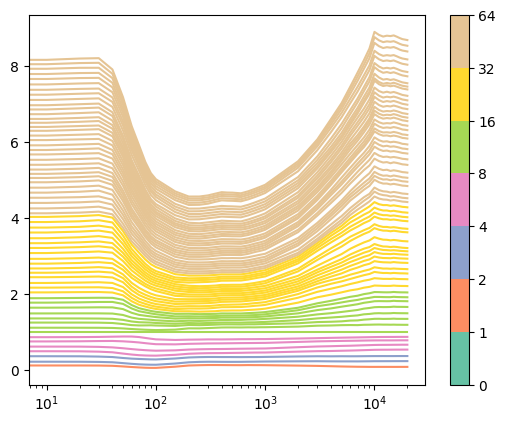

In [103]:
# df_run[df_run.module == "radiance_field/mlp_base/elastic_mlp/hidden_layers.0.weight"].plot(x='step', y='weight/L1', subplots=True)

# def plot_norms_for_widths(df, module_name, metric_type):

cc = ColorConfig()
module_name = "radiance_field/mlp_base/elastic_mlp/hidden_layers.0.weight"
# metric_type = "weight/L1"
metric_type = "weight_scaled/L1"
# metric_type = "weight_scaled/Spectral (max)"
base_width = 8
# norm_map = df_run[df_run["width"] == base_width].set_index("step")[metric_type]
# df_run[f"{metric_type}/scaled"] = df_run.apply(
#     lambda row: row[metric_type] / norm_map[row["step"]], axis=1
# )
df = df_run[df_run.module == module_name].groupby(by="width")
for width, width_group in df:
    color = cc.get_color(width)
    plt.plot(width_group["step"], width_group[f"{metric_type}"], color=color)
plt.xscale("log")
cc.get_colorbar(plt.gca())
# module_name = "radiance_field/mlp_base/elastic_mlp/hidden_layers.0.weight"
# metric_type = "weight/L1"
# norms = df[df.module == module_name][metric_type]
# for width_idx in

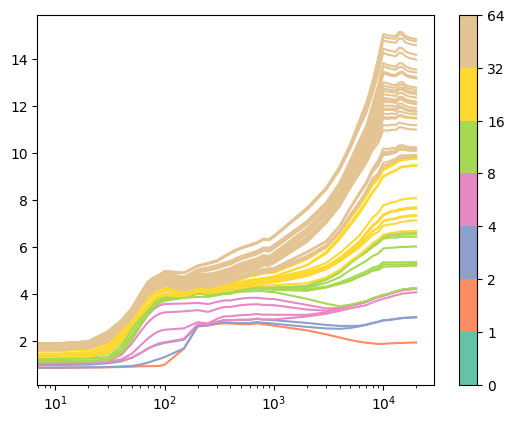

In [105]:
metric_type = "weight/Spectral (max)"
df = df_run[df_run.module == module_name].groupby(by="width")
for width, width_group in df:
    color = cc.get_color(width)
    plt.plot(width_group["step"], width_group[f"{metric_type}"], color=color)
plt.xscale("log")
cc.get_colorbar(plt.gca())

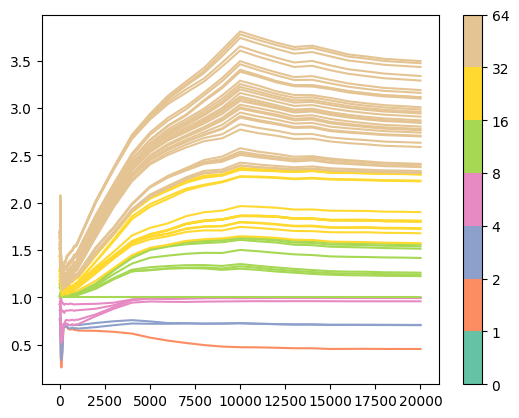

In [106]:
metric_type = "weight_scaled/Spectral (max)"
df = df_run[df_run.module == module_name].groupby(by="width")
for width, width_group in df:
    color = cc.get_color(width)
    plt.plot(width_group["step"], width_group[f"{metric_type}"], color=color)
# plt.xscale("log")
cc.get_colorbar(plt.gca())

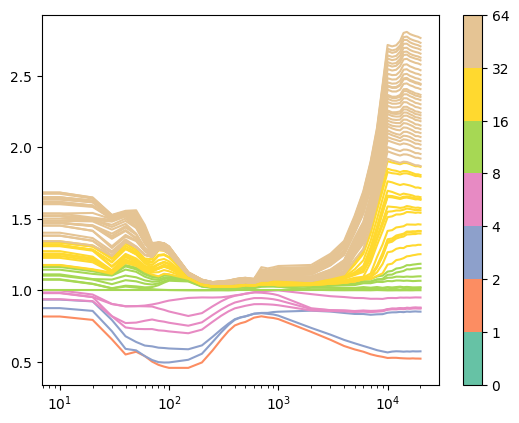

In [101]:
metric_type = "weight_scaled/Spectral (max)"
df = df_run[df_run.module == module_name].groupby(by="width")
for width, width_group in df:
    color = cc.get_color(width)
    plt.plot(width_group["step"], width_group[f"{metric_type}"], color=color)
plt.xscale("log")
cc.get_colorbar(plt.gca())

In [65]:
metric_type = "weight/L1"
module_name = "radiance_field/mlp_base/elastic_mlp/hidden_layers.0.weight"
width_group[width_group.module == module_name]
for 


,step,width,module,sampling_strategy,loss_weight_strategy,radiance_field.use_elastic,radiance_field.use_elastic_head,density_field.use_elastic,num_widths_to_sample,model_type,...,fused_eval,host_machine,weight/L1,grad/L1,weight/Frobenius,grad/Frobenius,weight/Spectral (max),grad/Spectral (max),weight/Spectral (min),grad/Spectral (min)
0,0,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,4.583930,NaN,0.904283,NaN,0.904283,NaN,0.904283,NaN
576,10,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,4.581790,0.002197,0.904630,0.000536,0.904630,0.000536,0.904630,0.000536
1152,20,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,4.590378,0.004596,0.908874,0.001077,0.908874,0.001077,0.908874,0.001077
1728,30,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,4.618685,0.180835,0.921370,0.037019,0.921370,0.037019,0.921370,0.037019
2304,40,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,4.676763,0.368361,0.955256,0.070483,0.955257,0.070483,0.955257,0.070483
2880,50,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,4.727906,0.776933,1.017391,0.150177,1.017391,0.150177,1.017391,0.150177
3456,60,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,5.240800,0.310528,1.141925,0.069617,1.141925,0.069617,1.141925,0.069617
4032,70,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,5.913022,1.365097,1.292069,0.267605,1.292069,0.267605,1.292069,0.267605
4608,80,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,6.105375,1.478594,1.347569,0.361147,1.347569,0.361147,1.347569,0.361147
5184,90,1,radiance_field/mlp_base/elastic_mlp/hidden_lay...,uniform,uniform,True,True,True,1,ngp_prop,...,True,cheetah,6.365402,0.961907,1.408233,0.216243,1.408233,0.216243,1.408233,0.216243


In [4]:
# run_id = "cvqep6vx"
# training_dynamics_path = (
#     results_cache_dir / run_id / "weights_grads/training_dynamics.pt"
# )
# training_dynamics = torch.load(training_dynamics_path)
# weight_norms = training_dynamics["weight_norms"]
# grad_norms = training_dynamics["grad_norms"]
# steps = training_dynamics["training_steps"]
# config = training_dynamics["config"]
# model_type = training_dynamics["model_type"]
# # fp = "/home/user/shared/results/elastic-nerf/cvqep6vx/weights_grads/proposal_net_0_step_5000.pt"
# fp = "/home/user/shared/results/elastic-nerf/cvqep6vx/weights_grads/radiance_field_step_5000.pt"
# wg = torch.load(fp)
# print(wg["params"].keys())
# print(wg["gradients"].keys())
# wg["gradients"]["mlp_base.elastic_mlp.output_layer.weight"]

In [114]:
import numpy as np


def generate_tensor():
    tensor = np.zeros(64)

    # Set the first 8 elements
    tensor[:8] = np.random.randn(8)
    tensor[:8] /= np.std(tensor[:8]) / np.sqrt(1 / 8.0)

    # Set the next 8 elements
    remaining_std = np.sqrt((16 * (1 / 16.0) - np.sum(tensor[:8] ** 2)) / 8.0)
    tensor[8:16] = np.random.randn(8) * remaining_std

    # Set the next 16 elements
    remaining_std = np.sqrt((32 * (1 / 32.0) - np.sum(tensor[:16] ** 2)) / 16.0)
    tensor[16:32] = np.random.randn(16) * remaining_std

    # Set the remaining 32 elements
    remaining_std = np.sqrt((64 * (1 / 64.0) - np.sum(tensor[:32] ** 2)) / 32.0)
    tensor[32:] = np.random.randn(32) * remaining_std

    return tensor


def test_tensor_std():
    tensor = generate_tensor()

    assert np.isclose(
        fn(tensor[:8]), np.sqrt(1 / 8)
    ), f"Std of first 8 elements doesn't match {fn(tensor[:8])} vs {np.sqrt(1 / 8)}"
    assert np.isclose(
        fn(tensor[:16]), np.sqrt(1 / 16)
    ), f"Std of first 16 elements doesn't match {np.std(tensor[:16])} vs {np.sqrt(1 / 16)}"
    assert np.isclose(
        np.std(tensor[:32]), np.sqrt(1 / 32)
    ), f"Std of first 32 elements doesn't match {np.std(tensor[:32])} vs {np.sqrt(1 / 32)}"
    assert np.isclose(
        np.std(tensor[:64]), np.sqrt(1 / 64)
    ), f"Std of all 64 elements doesn't match {np.std(tensor[:64])} vs {np.sqrt(1 / 64)}"

    print("All tests passed!")


# Run the tests
test_tensor_std()

/tmp/ipykernel_874255/3201438351.py:12: RuntimeWarning: invalid value encountered in sqrt
  remaining_std = np.sqrt((16 * (1 / 16.0) - np.sum(tensor[:8] ** 2)) / 8.0)


AssertionError: Std of first 16 elements doesn't match nan vs 0.25

In [116]:
tensor = np.zeros(64)

# Set the first 8 elements
tensor[:8] = np.random.randn(8)
tensor[:8] /= np.std(tensor[:8]) / np.sqrt(1 / 8.0)

In [ ]:
# Set the next 8 elements
remaining_std = np.sqrt((16 * (1 / 16.0) - np.sum(tensor[:8] ** 2)) / 8.0)
tensor[8:16] = np.random.randn(8) * remaining_std

# Set the next 16 elements
remaining_std = np.sqrt((32 * (1 / 32.0) - np.sum(tensor[:16] ** 2)) / 16.0)
tensor[16:32] = np.random.randn(16) * remaining_std

# Set the remaining 32 elements
remaining_std = np.sqrt((64 * (1 / 64.0) - np.sum(tensor[:32] ** 2)) / 32.0)
tensor[32:] = np.random.randn(32) * remaining_std

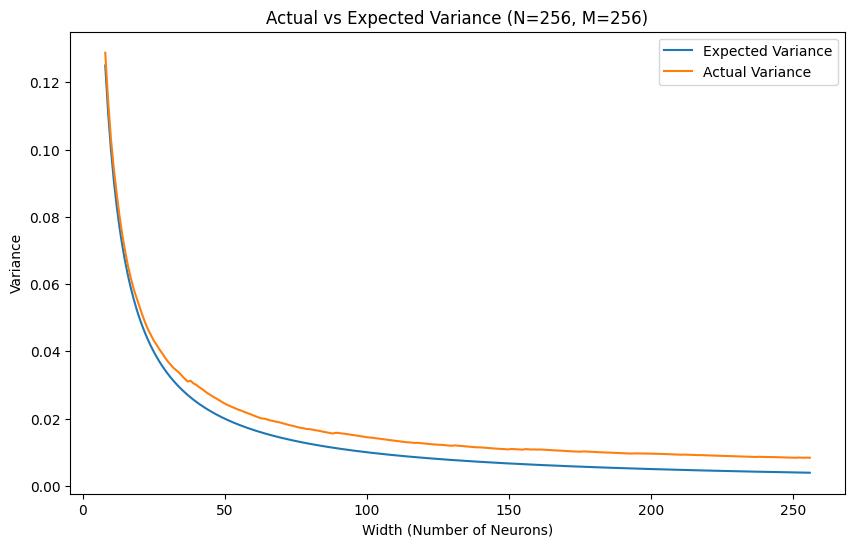

In [164]:
import numpy as np
from scipy.optimize import minimize


def objective_function(tensor):
    diff_sq = 0

    diff_sq += (np.var(tensor[:8]) - float(1 / 8)) ** 2
    diff_sq += (np.var(tensor[:16]) - float(1 / 16)) ** 2
    # diff_sq += (np.std(tensor[:24]) - np.sqrt(1 / 24)) ** 2
    diff_sq += (np.var(tensor[:32]) - float(1 / 32)) ** 2
    # diff_sq += (np.std(tensor[:40]) - np.sqrt(1 / 40)) ** 2
    # diff_sq += (np.std(tensor[:48]) - np.sqrt(1 / 48)) ** 2
    # diff_sq += (np.std(tensor[:56]) - np.sqrt(1 / 56)) ** 2
    diff_sq += (np.var(tensor[:64]) - float(1 / 64)) ** 2
    diff_sq += (np.var(tensor[:128]) - float(1 / 128)) ** 2
    diff_sq += (np.var(tensor[:256]) - float(1 / 256)) ** 2

    return diff_sq


def generate_tensor():
    # Initialize the tensor with random values
    tensor = np.random.randn(256)

    # Define the bounds for each element
    bounds = [(-10, 10)] * 256

    # Perform optimization
    result = minimize(objective_function, tensor, method="L-BFGS-B", bounds=bounds)

    optimized_tensor = result.x

    return optimized_tensor


def test_tensor_std():
    tensor = generate_tensor()

    # print("Std of first 8 elements:", np.std(tensor[:8]), np.sqrt(1 / 8))
    # print("Std of first 16 elements:", np.std(tensor[:16]), np.sqrt(1 / 16))
    # print("Std of first 32 elements:", np.std(tensor[:32]), np.sqrt(1 / 32))
    # print("Std of all 64 elements:", np.std(tensor[:64]), np.sqrt(1 / 64))

    return tensor


tensors = []
for i in range(256):
    tensor = test_tensor_std()
    tensors.append(tensor)

tensors = np.array(tensors)
expected_stds = [1.0 / float(i) for i in range(8, 256 + 1)]
actual_stds = [np.var(tensors[:i, :i]) for i in range(8, 256 + 1)]

plt.figure(figsize=(10, 6))
plt.plot(range(8, 256 + 1), expected_stds, label="Expected Variance")
plt.plot(range(8, 256 + 1), actual_stds, label="Actual Variance")
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Variance")
plt.legend()
plt.title(f"Actual vs Expected Variance (N={256}, M={256})")
plt.show()

In [174]:
def obj2(tensor_arr):
    tensor = tensor_arr.reshape(256, 256)
    diff_sq = 0

    diff_sq += (np.var(tensor[:8, :8]) - float(1 / 8)) ** 2
    diff_sq += (np.var(tensor[:16, :16]) - float(1 / 16)) ** 2
    # diff_sq += (np.std(tensor[:24]) - np.sqrt(1 / 24)) ** 2
    diff_sq += (np.var(tensor[:32, :32]) - float(1 / 32)) ** 2
    # diff_sq += (np.std(tensor[:40]) - np.sqrt(1 / 40)) ** 2
    # diff_sq += (np.std(tensor[:48]) - np.sqrt(1 / 48)) ** 2
    # diff_sq += (np.std(tensor[:56]) - np.sqrt(1 / 56)) ** 2
    diff_sq += (np.var(tensor[:64, :64]) - float(1 / 64)) ** 2
    diff_sq += (np.var(tensor[:128, :128]) - float(1 / 128)) ** 2
    diff_sq += (np.var(tensor[:256, :256]) - float(1 / 256)) ** 2

    return diff_sq


input = tensors.copy()
input = input.reshape(256 * 256)
result = minimize(obj2, input, method="L-BFGS-B")
result = result.x.reshape(256, 256)

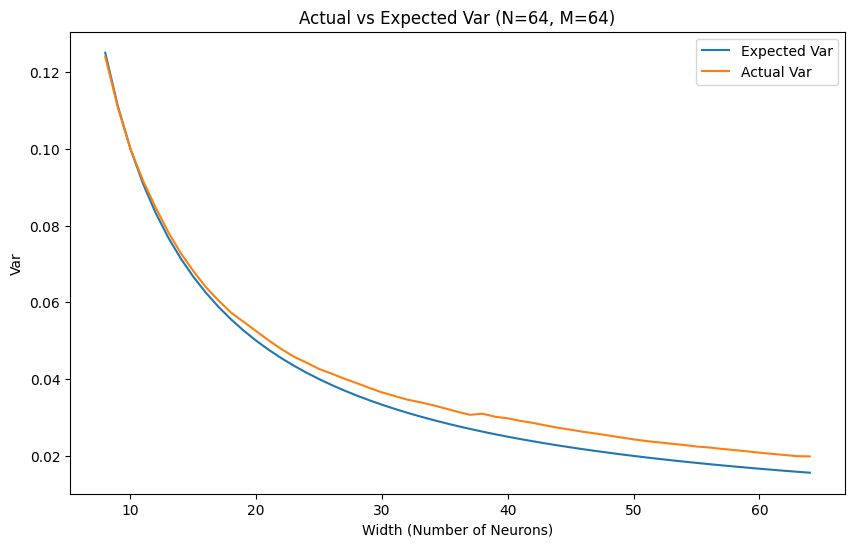

In [175]:
expected_stds = [1.0 / (float(i)) for i in range(8, 64 + 1)]
actual_stds = [np.var(result[:i, :i]) for i in range(8, 64 + 1)]

plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), expected_stds, label="Expected Var")
plt.plot(range(8, 64 + 1), actual_stds, label="Actual Var")
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Var")
plt.legend()
plt.title(f"Actual vs Expected Var (N={64}, M={64})")
plt.show()

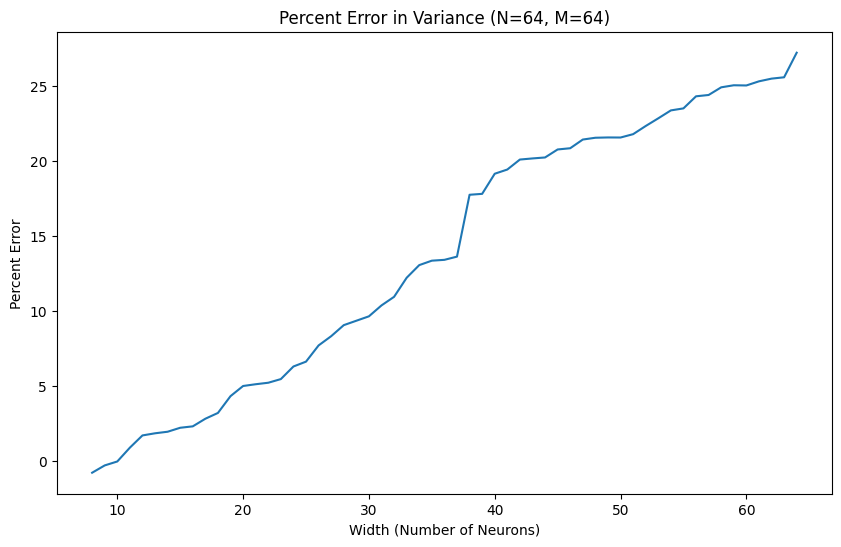

In [176]:
percent_error = [
    100 * (actual_stds[i] - expected_stds[i]) / expected_stds[i]
    for i in range(len(expected_stds))
]
# Plot percent error
plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), percent_error)
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Percent Error")
plt.title(f"Percent Error in Variance (N={64}, M={64})")
plt.show()

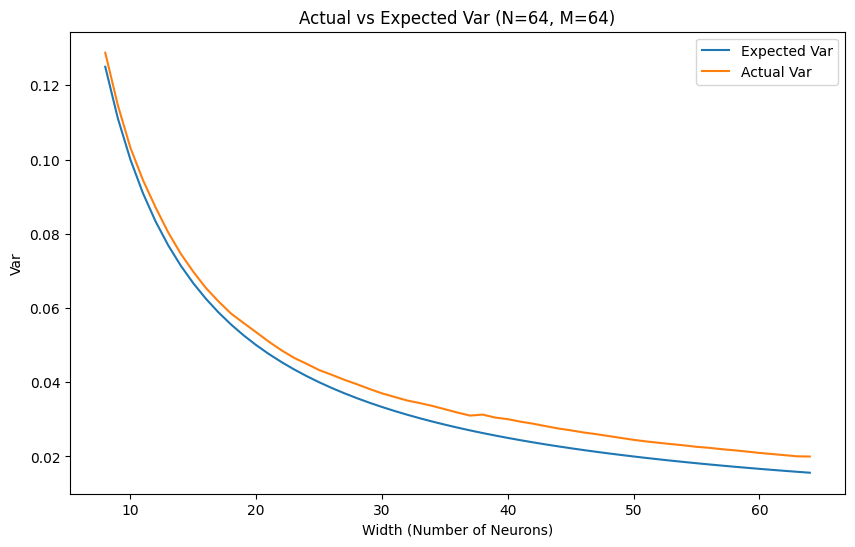

In [165]:
expected_stds = [1.0 / (float(i)) for i in range(8, 64 + 1)]
actual_stds = [np.var(tensors[:i, :i]) for i in range(8, 64 + 1)]

plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), expected_stds, label="Expected Var")
plt.plot(range(8, 64 + 1), actual_stds, label="Actual Var")
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Var")
plt.legend()
plt.title(f"Actual vs Expected Var (N={64}, M={64})")
plt.show()

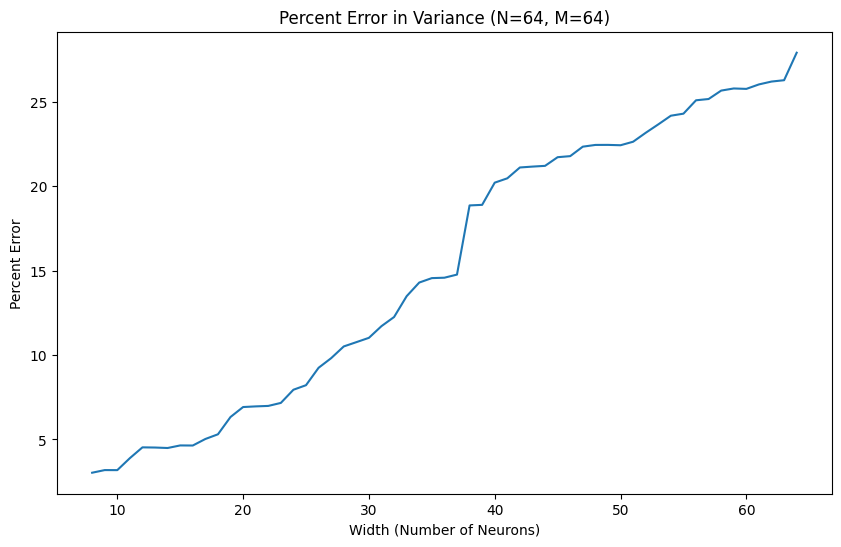

In [166]:
percent_error = [
    100 * (actual_stds[i] - expected_stds[i]) / expected_stds[i]
    for i in range(len(expected_stds))
]
# Plot percent error
plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), percent_error)
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Percent Error")
plt.title(f"Percent Error in Variance (N={64}, M={64})")
plt.show()

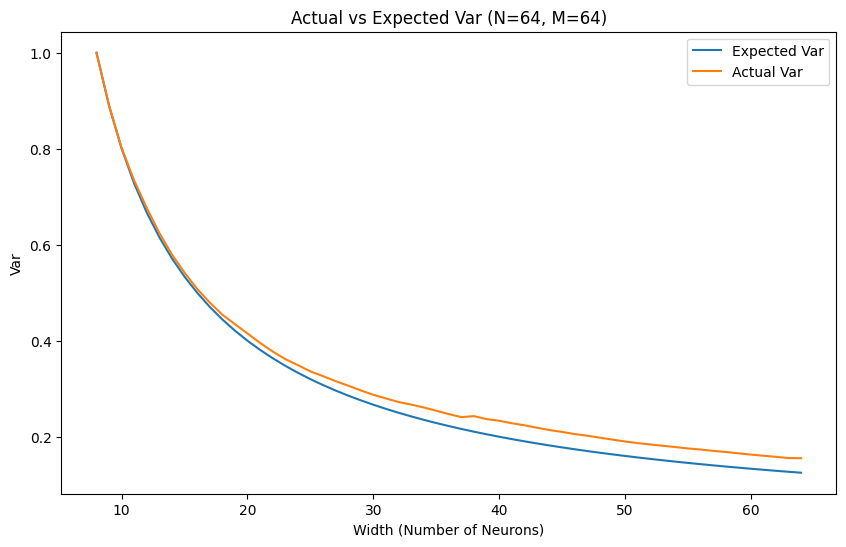

In [167]:
expected_scales = [s / expected_stds[0] for s in expected_stds]
actual_scales = [s / actual_stds[0] for s in actual_stds]

plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), expected_scales, label="Expected Var")
plt.plot(range(8, 64 + 1), actual_scales, label="Actual Var")
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Var")
plt.legend()
plt.title(f"Actual vs Expected Var (N={64}, M={64})")
plt.show()

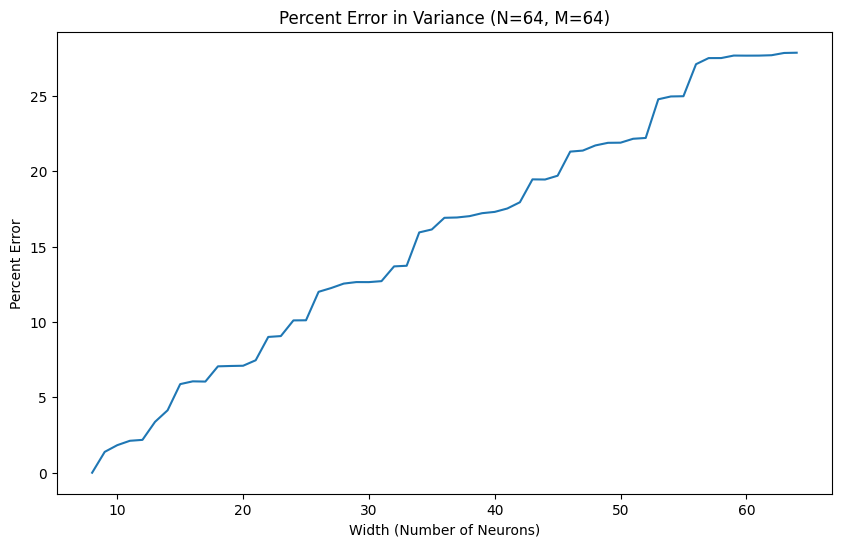

In [163]:
percent_error = [
    100 * (actual_scales[i] - expected_scales[i]) / expected_scales[i]
    for i in range(len(expected_scales))
]
# Plot percent error
plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), percent_error)
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Percent Error")
plt.title(f"Percent Error in Variance (N={64}, M={64})")
plt.show()

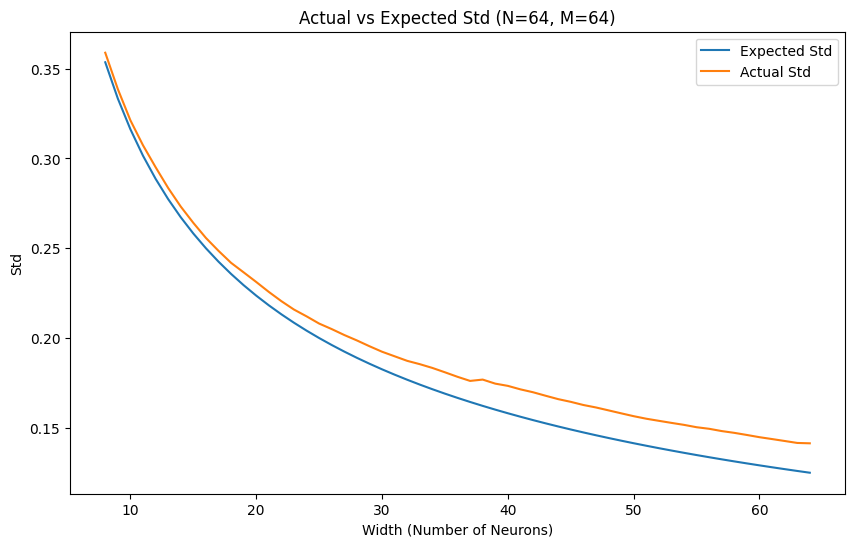

In [168]:
expected_stds = [1.0 / np.sqrt(float(i)) for i in range(8, 64 + 1)]
actual_stds = [np.std(tensors[:i, :i]) for i in range(8, 64 + 1)]

plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), expected_stds, label="Expected Std")
plt.plot(range(8, 64 + 1), actual_stds, label="Actual Std")
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Std")
plt.legend()
plt.title(f"Actual vs Expected Std (N={64}, M={64})")
plt.show()

Variance of first 8 elements: 1.0467646947465141 0.125
Variance of first 16 elements: 0.843065794354886 0.0625
Variance of first 24 elements: 0.8817346486403042 0.041666666666666664
Variance of first 32 elements: 0.8814409320381158 0.03125
Variance of first 40 elements: 0.9211149306415591 0.025
Variance of first 48 elements: 0.9631181784341535 0.020833333333333332
Variance of first 56 elements: 0.9401000710569942 0.017857142857142856
Variance of first 64 elements: 0.9392283635825578 0.015625
Variance of first 8 elements: 1.0467646955824081 0.125
Variance of first 16 elements: 0.8430657945681594 0.0625
Variance of first 24 elements: 0.8817346487365021 0.041666666666666664
Variance of first 32 elements: 0.8814409320926921 0.03125
Variance of first 40 elements: 0.9211149306767927 0.025
Variance of first 48 elements: 0.9631181784588801 0.020833333333333332
Variance of first 56 elements: 0.9401000710751396 0.017857142857142856
Variance of first 64 elements: 0.939228363596524 0.015625
Varian

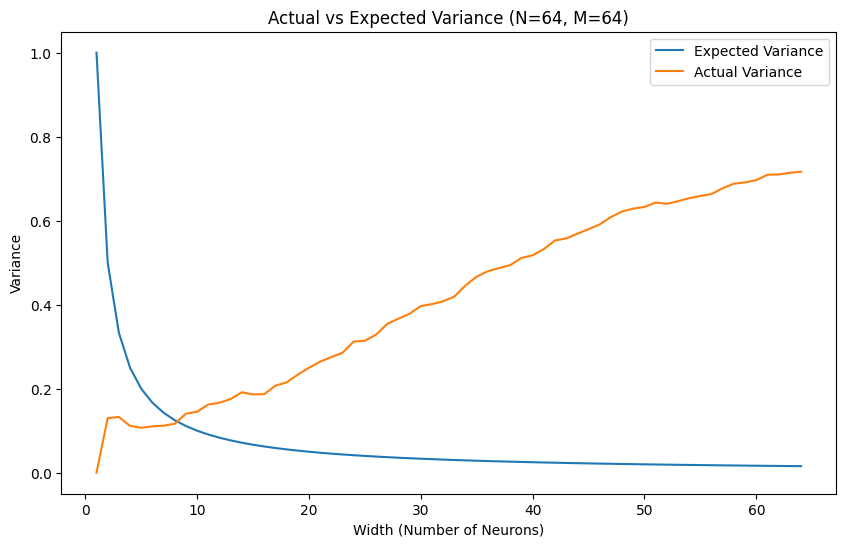

In [134]:
import numpy as np
from scipy.optimize import minimize
import torch
import torch.nn as nn
import matplotlib.pyplot as plt


class CustomLinearInitializer(nn.Module):
    def __init__(
        self,
        in_features,
        out_features,
        min_width=8,
        widths_to_care_about=[8, 16, 24, 32, 40, 48, 56, 64],
    ):
        super(CustomLinearInitializer, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.min_width = min_width
        self.widths_to_care_about = widths_to_care_about
        self.weight = nn.Parameter(torch.Tensor(out_features, in_features))
        self.reset_parameters()

    def reset_parameters(self):
        self.weight.data = torch.from_numpy(self.generate_tensor()).float()

    def generate_tensor(self):
        tensor = np.random.randn(self.out_features * self.in_features)
        bounds = [(-10, 10)] * len(tensor)
        result = minimize(
            self.objective_function, tensor, method="L-BFGS-B", bounds=bounds
        )
        optimized_tensor = result.x.reshape(self.out_features, self.in_features)
        return optimized_tensor

    def objective_function(self, tensor):
        tensor = tensor.reshape(self.out_features, self.in_features)
        diff_sq = 0

        for i in self.widths_to_care_about:
            diff_sq += (np.var(tensor[:i, :i]) - (1.0 / float(i))) ** 2
            print(
                f"Variance of first {i} elements:",
                np.var(tensor[:i, :i]),
                1.0 / float(i),
            )

        return diff_sq

    def forward(self, x):
        return torch.matmul(self.weight, x.transpose(0, 1)).transpose(0, 1)


def test_initializer(in_features, out_features):
    layer = CustomLinearInitializer(in_features, out_features)

    expected_stds = [1.0 / float(i) for i in range(1, out_features + 1)]
    actual_stds = [
        np.var(layer.weight.data[:i, :i].numpy()) for i in range(1, out_features + 1)
    ]

    plt.figure(figsize=(10, 6))
    plt.plot(range(1, out_features + 1), expected_stds, label="Expected Variance")
    plt.plot(range(1, out_features + 1), actual_stds, label="Actual Variance")
    plt.xlabel("Width (Number of Neurons)")
    plt.ylabel("Variance")
    plt.legend()
    plt.title(f"Actual vs Expected Variance (N={out_features}, M={in_features})")
    plt.show()
    return layer


# Test the initializer with different shapes
layer1 = test_initializer(in_features=64, out_features=64)

In [ ]:
layer2 = test_initializer(in_features=128, out_features=256)

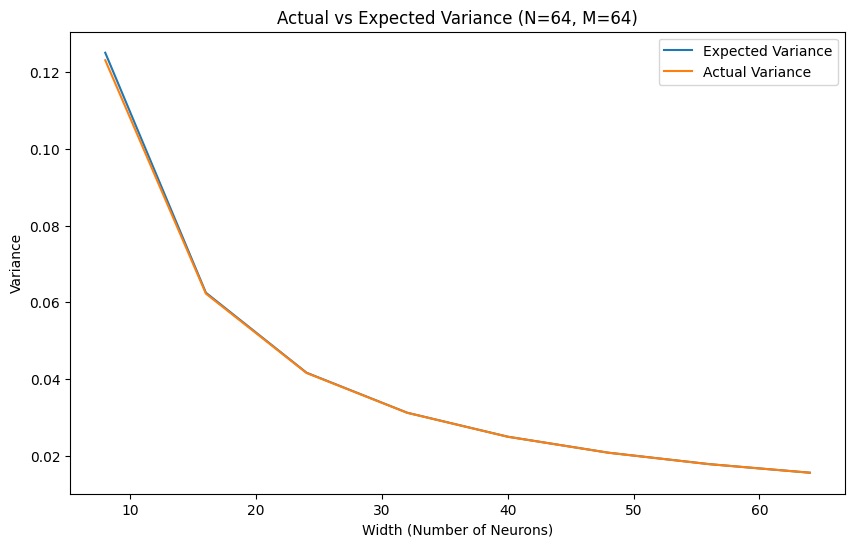

In [28]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt


class CustomLinearInitializer(nn.Module):
    def __init__(self, in_features, out_features, widths_to_care_about):
        super(CustomLinearInitializer, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.widths_to_care_about = widths_to_care_about
        self.weight = nn.Parameter(torch.Tensor(out_features, in_features))
        self.reset_parameters()

    def reset_parameters(self):
        torch.nn.init.xavier_uniform_(self.weight)

    def forward(self, x):
        return torch.matmul(self.weight, x.transpose(0, 1)).transpose(0, 1)


def objective_function(layer, widths_to_care_about):
    loss = 0
    for i in widths_to_care_about:
        submatrix = layer.weight[:i, :i]
        variance = torch.var(submatrix)
        desired_variance = 1.0 / i
        loss += (variance - desired_variance) ** 2
    return loss


def optimize_weights(
    layer, widths_to_care_about, num_iterations=2000, learning_rate=0.01
):
    optimizer = optim.Adam(layer.parameters(), lr=learning_rate)
    weights = []

    for _ in range(num_iterations):
        optimizer.zero_grad()
        weights.append(layer.weight.data.clone())
        loss = objective_function(layer, widths_to_care_about)
        loss.backward()
        optimizer.step()

    return layer, weights


def test_initializer(in_features, out_features, widths_to_care_about):
    layer = CustomLinearInitializer(in_features, out_features, widths_to_care_about).to(
        torch.device("cuda:0")
    )
    optimized_layer, weights = optimize_weights(layer, widths_to_care_about)

    expected_vars = [1.0 / i for i in widths_to_care_about]
    actual_vars = [
        np.var(optimized_layer.weight.data[:i, :i].cpu().numpy())
        for i in widths_to_care_about
    ]

    plt.figure(figsize=(10, 6))
    plt.plot(widths_to_care_about, expected_vars, label="Expected Variance")
    plt.plot(widths_to_care_about, actual_vars, label="Actual Variance")
    plt.xlabel("Width (Number of Neurons)")
    plt.ylabel("Variance")
    plt.legend()
    plt.title(f"Actual vs Expected Variance (N={out_features}, M={in_features})")
    plt.show()
    return optimized_layer, weights


# Test the initializer with different shapes
widths_to_care_about = [8, 16, 24, 32, 40, 48, 56, 64]
layer1, weights = test_initializer(
    in_features=64, out_features=64, widths_to_care_about=widths_to_care_about
)

In [29]:
for step, weight in enumerate(weights):
    for i in widths_to_care_about:
        chunk = weight[:i, :i].cpu().numpy()
        variance = np.var(chunk)
        mean = np.mean(chunk)
        print(f"Step {step}: Variance of first {i} elements: {variance}, Mean: {mean}")

Step 0: Variance of first 8 elements: 0.015209024772047997, Mean: -7.515773177146912e-05
Step 0: Variance of first 16 elements: 0.0160188227891922, Mean: -0.004931998904794455
Step 0: Variance of first 24 elements: 0.015709036961197853, Mean: -2.791463521134574e-05
Step 0: Variance of first 32 elements: 0.015296698547899723, Mean: 0.004276571329683065
Step 0: Variance of first 40 elements: 0.015484270639717579, Mean: 0.0028546242974698544
Step 0: Variance of first 48 elements: 0.0154731972143054, Mean: 0.00416417233645916
Step 0: Variance of first 56 elements: 0.01568637415766716, Mean: 0.0026279264129698277
Step 0: Variance of first 64 elements: 0.015596901066601276, Mean: 0.0025826385244727135
Step 1: Variance of first 8 elements: 0.017368363216519356, Mean: -0.0003875279799103737
Step 1: Variance of first 16 elements: 0.01830846071243286, Mean: -0.005323468241840601
Step 1: Variance of first 24 elements: 0.017969081178307533, Mean: -9.332866466138512e-05
Step 1: Variance of first 32

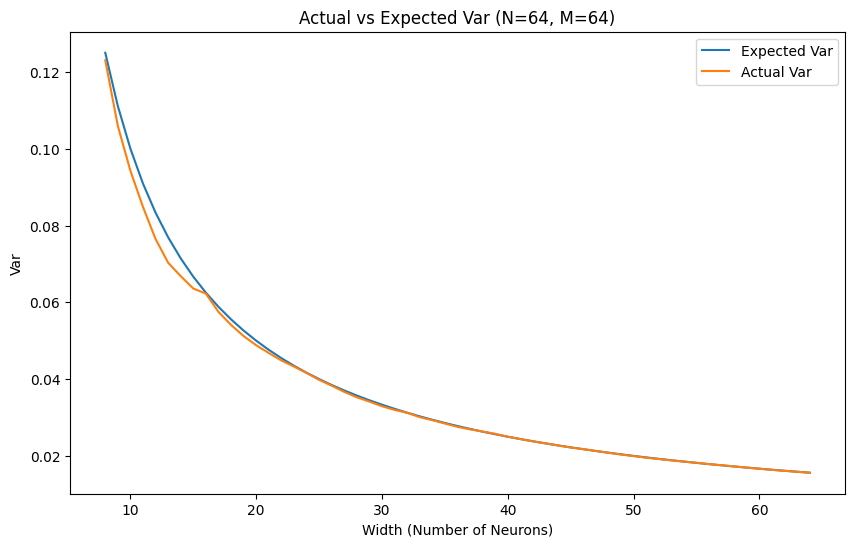

In [33]:
result = layer1.weight.data.cpu().numpy()
expected_var = [1.0 / (float(i)) for i in range(8, 64 + 1)]
actual_var = [np.var(result[:i, :i]) for i in range(8, 64 + 1)]
spectral_norm = [
    torch.linalg.matrix_norm(layer1.weight.data[:i, :i], ord=2).cpu().numpy()
    for i in range(8, 64 + 1)
]
spectral_norm_scaled = [
    spectral_norm[i] / spectral_norm[0] for i in range(len(spectral_norm))
]

plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), expected_var, label="Expected Var")
plt.plot(range(8, 64 + 1), actual_var, label="Actual Var")
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Var")
plt.legend()
plt.title(f"Actual vs Expected Var (N={64}, M={64})")
plt.show()

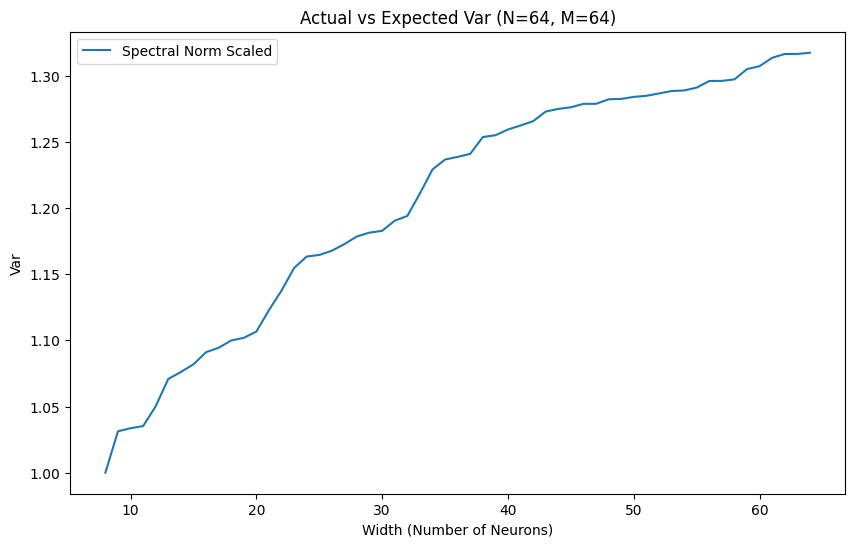

In [34]:
plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), spectral_norm_scaled, label="Spectral Norm Scaled")
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Var")
plt.legend()
plt.title(f"Actual vs Expected Var (N={64}, M={64})")
plt.show()

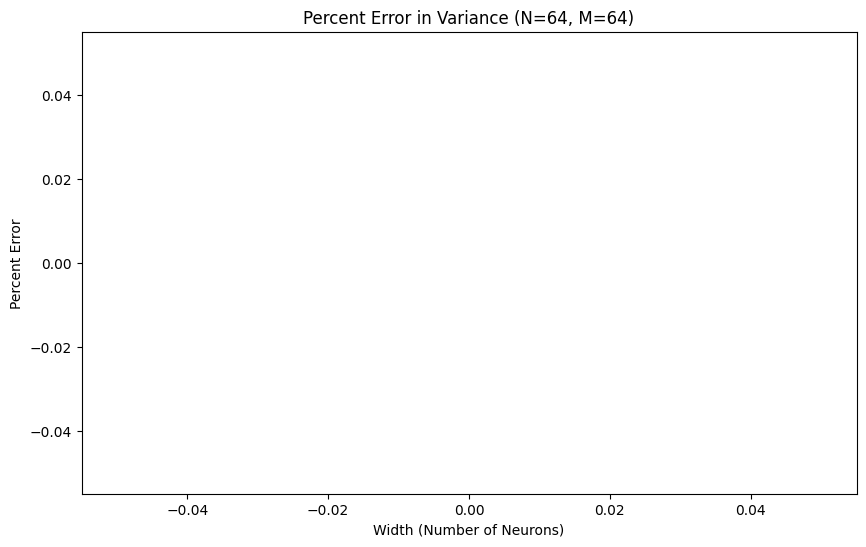

In [188]:
percent_error = [
    100 * (abs(actual_var[i] - expected_var[i])) / expected_var[i]
    for i in range(len(expected_var))
]
# Plot percent error
plt.figure(figsize=(10, 6))
plt.plot(range(8, 64 + 1), percent_error)
plt.xlabel("Width (Number of Neurons)")
plt.ylabel("Percent Error")
plt.title(f"Percent Error in Variance (N={64}, M={64})")
plt.show()

In [189]:
percent_error

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan]

In [ ]:
variance = sum((x_i - mean)^2)/ N
Since I expect a mean of 0, I can simplify this to:
variance = sum(x_i^2) / N
Let's say I have a vector of length 8. I want the first 4 elements to have variance of 1/4,
the first 6 elements to have variance of 1/6, and the first 8 elements to have variance of 1/8.
I can write this as:


In [26]:
arr = np.random.randn(64)
first_chunk_len = 8
print(np.var(arr[:first_chunk_len]))
arr[:first_chunk_len] = (
    (arr[:first_chunk_len] - np.mean(arr[:first_chunk_len]))
    / np.std(arr[:first_chunk_len])
) * np.sqrt(1 / first_chunk_len)
print(
    np.mean(arr[:first_chunk_len]),
    np.var(arr[:first_chunk_len]),
    np.std(arr[:first_chunk_len]),
    1 / first_chunk_len,
    1 / np.sqrt(first_chunk_len),
)

0.37648846600627306
0.0 0.125 0.3535533905932738 0.125 0.35355339059327373


In [27]:
chunk_len = 8
for i in range(first_chunk_len, 64, chunk_len):
    print(f"Slicing chunk {i} to {i + chunk_len}")
    chunk = arr[i : i + chunk_len]
    chunk = ((chunk - np.mean(chunk)) / np.std(chunk)) * np.sqrt(1 / (i + chunk_len))
    arr[i : i + chunk_len] = chunk
    print(
        "\t",
        np.mean(arr[i : i + chunk_len]),
        np.var(arr[i : i + chunk_len]),
        np.var(arr[: i + chunk_len]),
        1 / (i + chunk_len),
    )

Slicing chunk 8 to 16
	 6.938893903907228e-18 0.0625 0.09375000000000001 0.0625
Slicing chunk 16 to 24
	 6.938893903907228e-18 0.041666666666666685 0.0763888888888889 0.041666666666666664
Slicing chunk 24 to 32
	 0.0 0.03125000000000001 0.06510416666666667 0.03125
Slicing chunk 32 to 40
	 -6.938893903907228e-18 0.024999999999999994 0.05708333333333333 0.025
Slicing chunk 40 to 48
	 3.469446951953614e-18 0.02083333333333333 0.05104166666666667 0.020833333333333332
Slicing chunk 48 to 56
	 6.938893903907228e-18 0.017857142857142856 0.046301020408163265 0.017857142857142856
Slicing chunk 56 to 64
	 -5.204170427930421e-18 0.015624999999999998 0.04246651785714286 0.015625


In [19]:
sum_so_far = 0
for i in range(first_chunk_len):
    sum_so_far += arr[i] ** 2

second_chunk_len = 16
expected_variance = 1 / second_chunk_len
remaining_variance = (expected_variance * second_chunk_len) - sum_so_far
print(remaining_variance)

-2.220446049250313e-16


In [30]:
print(np.mean(arr[:8]))
print(np.mean(arr[:16]))

0.0
0.0


In [4]:
# Load DF of training history
training_history_fp = "kebumdc0_8w0wks0x_qfkjdvv2_hy03dx0e_wsxh6gjo_8ishbvau_b674pjcs_58hgroe5_all_results.csv"
df = pd.read_csv(training_history_fp)
print(df.columns)
df = df[df["sweep_name"].str.endswith("baseline")]
df

Index(['Eval Results Summary/table',
       'Eval Results/num_sampled_times/elastic_8',
       'Eval Results/num_rays/elastic_8', 'Eval Results Summary/elapsed_time',
       'Train/max_depth/elastic_8', 'Train/num_sampled_times/elastic_8',
       'Test Image', 'Eval Results Summary/num_updates_skipped/elastic_8',
       '_step', 'Train/psnr/elastic_8',
       ...
       'density_field.base.output_init', 'density_field.base.bias_enabled',
       'density_field.base.hidden_activation',
       'density_field.base.output_activation', 'density_field._target',
       'density_field.use_elastic', 'density-field.use-elastic',
       'sampling-strategy', 'loss-weight-strategy', 'normalize-loss-weights'],
      dtype='object', length=229)


/tmp/ipykernel_1735606/128605660.py:3: DtypeWarning: Columns (73) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(training_history_fp)


,Eval Results Summary/table,Eval Results/num_sampled_times/elastic_8,Eval Results/num_rays/elastic_8,Eval Results Summary/elapsed_time,Train/max_depth/elastic_8,Train/num_sampled_times/elastic_8,Test Image,Eval Results Summary/num_updates_skipped/elastic_8,_step,Train/psnr/elastic_8,...,density_field.base.output_init,density_field.base.bias_enabled,density_field.base.hidden_activation,density_field.base.output_activation,density_field._target,density_field.use_elastic,density-field.use-elastic,sampling-strategy,loss-weight-strategy,normalize-loss-weights
0,NaN,NaN,NaN,NaN,6.076481,1001.0,NaN,NaN,1000,25.489285,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,7.641565,2001.0,NaN,NaN,2000,27.311756,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,7.040301,3001.0,NaN,NaN,3000,27.528126,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,8.157575,4001.0,NaN,NaN,4000,28.478146,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,8.128366,5001.0,NaN,NaN,5000,28.982370,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16000,NaN,...,torch.nn.init.xavier_uniform_,False,ReLU(),NaN,elastic_nerf.nerfacc.radiance_fields.ngp.NGPDe...,True,True,NaN,NaN,NaN
2236,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17000,NaN,...,torch.nn.init.xavier_uniform_,False,ReLU(),NaN,elastic_nerf.nerfacc.radiance_fields.ngp.NGPDe...,True,True,NaN,NaN,NaN
2237,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18000,NaN,...,torch.nn.init.xavier_uniform_,False,ReLU(),NaN,elastic_nerf.nerfacc.radiance_fields.ngp.NGPDe...,True,True,NaN,NaN,NaN
2238,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19000,NaN,...,torch.nn.init.xavier_uniform_,False,ReLU(),NaN,elastic_nerf.nerfacc.radiance_fields.ngp.NGPDe...,True,True,NaN,NaN,NaN


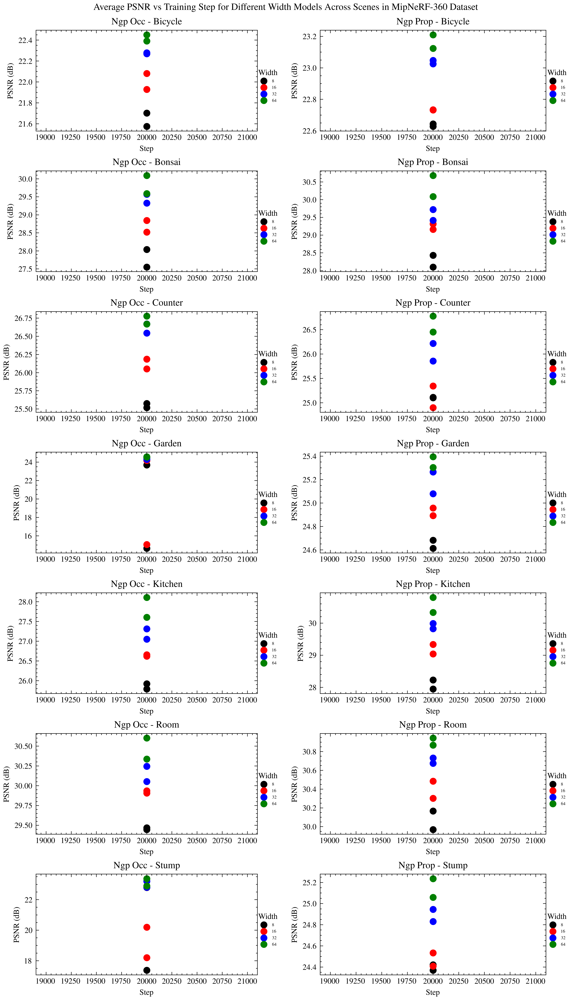

In [5]:
num_scenes = len(df["scene"].unique())
fig = plt.figure(layout="constrained", figsize=(8, 2 * num_scenes))
subfigs = fig.subfigures(1, 2, hspace=0.07)
for i, (model_type, model_group) in enumerate(df.groupby(by="model_type")):
    subfig = subfigs[i]
    axs = subfig.subplots(num_scenes, 1)
    for j, (scene, scene_group) in enumerate(model_group.groupby(by="scene")):
        ax = axs[j]
        for dim, dim_group in scene_group.groupby(by="hidden_dim"):
            psnr_col = f"Eval Results Summary/psnr_avg/elastic_{dim}"
            psnr_values = dim_group.loc[dim_group[psnr_col].notna(), psnr_col]
            steps = dim_group.loc[dim_group[psnr_col].notna(), "_step"]
            ax.scatter(
                steps,
                psnr_values,
                label=f"{dim}",
            )
        model_type_name = " ".join([m.capitalize() for m in model_type.split("_")])
        ax.set_title(f"{model_type_name} - {scene.capitalize()}")
        ax.set_xlabel("Step")
        ax.set_ylabel("PSNR (dB)")
        # ax.set_yscale("log")
        ax.legend(
            loc="upper right",
            bbox_to_anchor=(1.11, 0.65),
            fontsize="xx-small",
            fancybox=True,
            shadow=True,
            title="Width",
        )

fig.suptitle(
    "Average PSNR vs Training Step for Different Width Models Across Scenes in MipNeRF-360 Dataset"
)
plt.show()

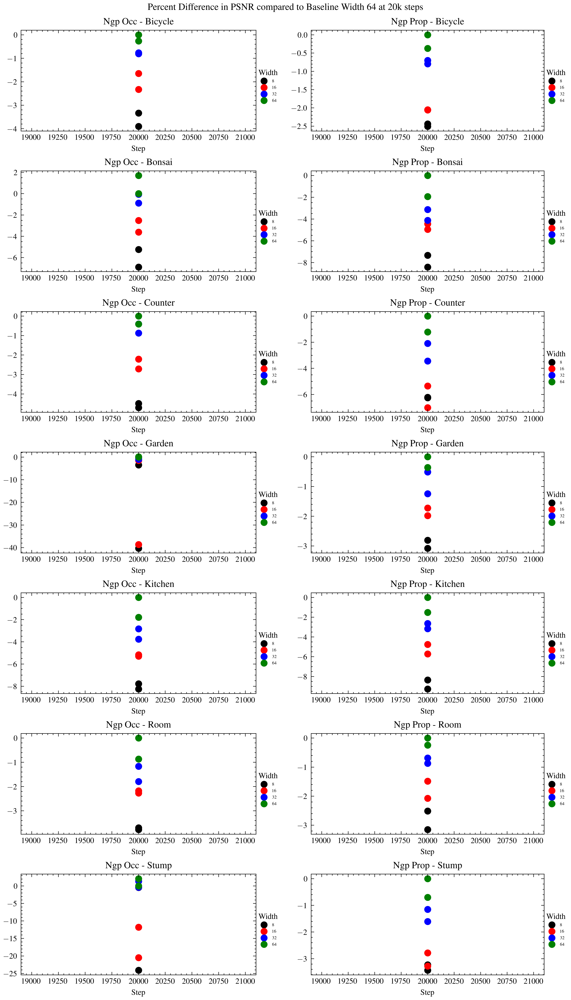

In [6]:
num_scenes = len(df["scene"].unique())
base_psnrs = {}
fig = plt.figure(layout="constrained", figsize=(8, 2 * num_scenes))
subfigs = fig.subfigures(1, 2, hspace=0.07)
for i, (model_type, model_group) in enumerate(df.groupby(by="model_type")):
    subfig = subfigs[i]
    axs = subfig.subplots(num_scenes, 1)
    for j, (scene, scene_group) in enumerate(model_group.groupby(by="scene")):
        ax = axs[j]
        base_psnr = scene_group.query("_step == 20000 and hidden_dim == 64")[
            "Eval Results Summary/psnr_avg/elastic_64"
        ].iloc[0]
        base_psnrs[scene] = base_psnr
        for dim, dim_group in scene_group.groupby(by="hidden_dim"):
            psnr_col = f"Eval Results Summary/psnr_avg/elastic_{dim}"
            psnr_values = np.array(dim_group.loc[dim_group[psnr_col].notna(), psnr_col])
            pc_increase = 100 * (psnr_values - base_psnr) / base_psnr
            steps = dim_group.loc[dim_group[psnr_col].notna(), "_step"]
            ax.scatter(
                steps,
                pc_increase,
                label=f"{dim}",
            )
        model_type_name = " ".join([m.capitalize() for m in model_type.split("_")])
        ax.set_title(f"{model_type_name} - {scene.capitalize()}")
        ax.set_xlabel("Step")
        ax.set_ylabel("% Diff")
        # ax.set_yscale("log")
        ax.legend(
            loc="upper right",
            bbox_to_anchor=(1.11, 0.65),
            fontsize="xx-small",
            fancybox=True,
            shadow=True,
            title="Width",
        )

fig.suptitle("Percent Difference in PSNR compared to Baseline Width 64 at 20k steps")
plt.show()

In [7]:
num_scenes = len(df["scene"].unique())
table_cols = ["Scene", "Width 64", "Width 32", "Width 16", "Width 8"]
for i, (model_type, model_group) in enumerate(df.groupby(by="model_type")):
    table_data = []
    model_group = model_group.query("_step == 20000")
    model_name_split = [m.capitalize() for m in model_type.split("_")]
    model_name_split[0] = model_name_split[0].upper()
    model_type_name = " ".join(model_name_split)
    for j, (scene, scene_group) in enumerate(model_group.groupby(by="scene")):
        base_psnr = scene_group.query("_step == 20000 and hidden_dim == 64")[
            "Eval Results Summary/psnr_avg/elastic_64"
        ].iloc[0]
        table_row = {"Scene": scene.capitalize()}
        for dim, dim_group in scene_group.groupby(by="hidden_dim"):
            psnr_col = f"Eval Results Summary/psnr_avg/elastic_{dim}"
            psnr_avg = dim_group[psnr_col].iloc[0]
            pc_diff = 100 * (psnr_avg - base_psnr) / base_psnr
            if dim == 64:
                table_row.update({f"Width {dim}": f"{psnr_avg:.2f}"})
            else:
                table_row.update({f"Width {dim}": f"{psnr_avg:.2f} ({pc_diff:.2f}%)"})
        table_data.append(table_row)

    table_data = pd.DataFrame(table_data, columns=table_cols)
    print(
        table_data.to_latex(
            index=False,
            caption=f"Baseline performance (PSNR) after 20k steps of training for {model_type_name} model at different widths across scenes from the MipNeRF-360 dataset",
            label=f"tab:baseline_{model_type_name.replace(' ', '_')}",
            position="h",
            column_format="lcccccc",
            escape=True,
            bold_rows=True
        )
    )

\begin{table}[h]
\caption{Baseline performance (PSNR) after 20k steps of training for NGP Occ model at different widths across scenes from the MipNeRF-360 dataset}
\label{tab:baseline_NGP_Occ}
\begin{tabular}{lcccccc}
\toprule
Scene & Width 64 & Width 32 & Width 16 & Width 8 \\
\midrule
Bicycle & 22.45 & 22.28 (-0.77\%) & 22.08 (-1.65\%) & 21.70 (-3.34\%) \\
Bonsai & 29.59 & 29.57 (-0.06\%) & 28.52 (-3.61\%) & 27.55 (-6.89\%) \\
Counter & 26.78 & 26.67 (-0.40\%) & 26.19 (-2.21\%) & 25.52 (-4.71\%) \\
Garden & 24.54 & 24.45 (-0.36\%) & 24.17 (-1.48\%) & 23.69 (-3.43\%) \\
Kitchen & 28.11 & 27.31 (-2.83\%) & 26.66 (-5.17\%) & 25.92 (-7.78\%) \\
Room & 30.60 & 30.24 (-1.17\%) & 29.94 (-2.17\%) & 29.47 (-3.70\%) \\
Stump & 22.89 & 22.81 (-0.35\%) & 18.20 (-20.50\%) & 22.80 (-0.41\%) \\
\bottomrule
\end{tabular}
\end{table}

\begin{table}[h]
\caption{Baseline performance (PSNR) after 20k steps of training for NGP Prop model at different widths across scenes from the MipNeRF-360 dataset}
\la

# Re-benchmark baselines with Head Depth = 2

In [20]:
from collections import defaultdict
import pandas as pd

# Assuming df is your DataFrame with all the required data
num_scenes = len(df["scene"].unique())
table_cols = ["Scene", "Width 64", "Width 32", "Width 16", "Width 8"]

# Header part of the table with merged columns for model types
header_row1 = [
    "\multicolumn{4}{c}{NGP Occ} & \\multicolumn{4}{c}{NGP Prop} \\\\",
]
header_row2 = [
    "\\textbf{Scene}",
    "Width 64",
    "Width 32",
    "Width 16",
    "Width 8",
    "Width 64",
    "Width 32",
    "Width 16",
    "Width 8",
]
header = (
    " & ".join(header_row1)
    + " \\midrule \n"
    + " & ".join(header_row2)
    + " \\\\ \\midrule"
)

table_data = []

base_psnrs = defaultdict(dict)
for j, (scene, scene_group) in enumerate(df.groupby(by="scene")):
    table_row = ["\\textbf{" + scene.capitalize() + "}"]  # Scene names in bold
    for i, (model_type, model_group) in enumerate(scene_group.groupby(by="model_type")):
        model_group = model_group.query("_step == 20000")
        model_group = model_group[model_group["radiance_field.head_depth"] == 2]
        base_psnr = model_group.query("hidden_dim == 64")[
            "Eval Results Summary/psnr_avg/elastic_64"
        ].iloc[0]
        base_psnrs[scene][model_type] = base_psnr
        for dim in [64, 32, 16, 8]:
            dim_group = model_group.query(f"hidden_dim == {dim}")
            psnr_col = f"Eval Results Summary/psnr_avg/elastic_{dim}"
            psnr_avg = dim_group[psnr_col].iloc[0]
            pc_diff = 100 * (psnr_avg - base_psnr) / base_psnr
            if dim == 64:
                table_row.append(f"{psnr_avg:.2f}")
            else:
                table_row.append(f"{psnr_avg:.2f} ({pc_diff:.1f}\\%)")
    table_data.append(table_row)

# Converting the Python list of lists to a LaTeX table
table_body = " \\\\\n".join([" & ".join(row) for row in table_data]) + " \\\\"

# Combining the header and body to form the final table
final_table = (
    "\\begin{table*}[h]\n\\centering\n\\small\n"
    "\\caption{Combined Baseline PSNR after 20k steps of training for NGP Occ and NGP Prop models at different widths across scenes from the MipNeRF-360 dataset}\n"
    "\\label{tab:combined_baseline_NGP}\n"
    "\\begin{tabular}{lcccc|cccc}\n\\toprule\n"
    + header
    + "\n"
    + table_body
    + "\n\\bottomrule\n"
    "\\end{tabular}\n\\end{table*}"
)
print(final_table)

\begin{table*}[h]
\centering
\small
\caption{Combined Baseline PSNR after 20k steps of training for NGP Occ and NGP Prop models at different widths across scenes from the MipNeRF-360 dataset}
\label{tab:combined_baseline_NGP}
\begin{tabular}{lcccc|cccc}
\toprule
\multicolumn{4}{c}{NGP Occ} & \multicolumn{4}{c}{NGP Prop} \\ \midrule 
\textbf{Scene} & Width 64 & Width 32 & Width 16 & Width 8 & Width 64 & Width 32 & Width 16 & Width 8 \\ \midrule
\textbf{Bicycle} & 22.39 & 22.28 (-0.5\%) & 22.08 (-1.4\%) & 21.57 (-3.7\%) & 23.21 & 23.05 (-0.7\%) & 22.73 (-2.1\%) & 22.64 (-2.4\%) \\
\textbf{Bonsai} & 30.09 & 29.57 (-1.7\%) & 28.52 (-5.2\%) & 28.04 (-6.8\%) & 30.68 & 29.72 (-3.1\%) & 29.31 (-4.5\%) & 28.43 (-7.3\%) \\
\textbf{Counter} & 26.78 & 26.67 (-0.4\%) & 26.19 (-2.2\%) & 25.58 (-4.5\%) & 26.78 & 26.22 (-2.1\%) & 25.34 (-5.4\%) & 25.10 (-6.3\%) \\
\textbf{Garden} & 24.58 & 24.45 (-0.5\%) & 15.06 (-38.7\%) & 14.64 (-40.4\%) & 25.39 & 25.26 (-0.5\%) & 24.96 (-1.7\%) & 24.61 (-3.1\%) \\


# Re-benchmark baselines with head depth = 1

In [21]:
import pandas as pd

# Assuming df is your DataFrame with all the required data
num_scenes = len(df["scene"].unique())
table_cols = ["Scene", "Width 64", "Width 32", "Width 16", "Width 8"]

# Header part of the table with merged columns for model types
header_row1 = [
    "\multicolumn{4}{c}{NGP Occ} & \\multicolumn{4}{c}{NGP Prop} \\\\",
]
header_row2 = [
    "\\textbf{Scene}",
    "Width 64",
    "Width 32",
    "Width 16",
    "Width 8",
    "Width 64",
    "Width 32",
    "Width 16",
    "Width 8",
]
header = (
    " & ".join(header_row1)
    + " \\midrule \n"
    + " & ".join(header_row2)
    + " \\\\ \\midrule"
)

table_data = []

for j, (scene, scene_group) in enumerate(df.groupby(by="scene")):
    table_row = ["\\textbf{" + scene.capitalize() + "}"]  # Scene names in bold
    for i, (model_type, model_group) in enumerate(scene_group.groupby(by="model_type")):
        model_group = model_group.query("_step == 20000")
        model_group = model_group[model_group["radiance_field.head_depth"] == 1]
        # base_psnr = model_group.query("hidden_dim == 64")[
        #     "Eval Results Summary/psnr_avg/elastic_64"
        # ].iloc[0]
        base_psnr = base_psnrs[scene][model_type]
        for dim in [64, 32, 16, 8]:
            dim_group = model_group.query(f"hidden_dim == {dim}")
            psnr_col = f"Eval Results Summary/psnr_avg/elastic_{dim}"
            psnr_avg = dim_group[psnr_col].iloc[0]
            pc_diff = 100 * (psnr_avg - base_psnr) / base_psnr
            table_row.append(f"{psnr_avg:.2f} ({pc_diff:.1f}\\%)")
    table_data.append(table_row)

# Converting the Python list of lists to a LaTeX table
table_body = " \\\\\n".join([" & ".join(row) for row in table_data]) + " \\\\"

# Combining the header and body to form the final table
final_table = (
    "\\begin{table*}[h]\n\\centering\n\\small\n"
    "\\caption{Combined Baseline PSNR after 20k steps of training for NGP Occ and NGP Prop models at different widths across scenes from the MipNeRF-360 dataset}\n"
    "\\label{tab:combined_baseline_NGP}\n"
    "\\begin{tabular}{lcccc|cccc}\n\\toprule\n"
    + header
    + "\n"
    + table_body
    + "\n\\bottomrule\n"
    "\\end{tabular}\n\\end{table*}"
)
print(final_table)

\begin{table*}[h]
\centering
\small
\caption{Combined Baseline PSNR after 20k steps of training for NGP Occ and NGP Prop models at different widths across scenes from the MipNeRF-360 dataset}
\label{tab:combined_baseline_NGP}
\begin{tabular}{lcccc|cccc}
\toprule
\multicolumn{4}{c}{NGP Occ} & \multicolumn{4}{c}{NGP Prop} \\ \midrule 
\textbf{Scene} & Width 64 & Width 32 & Width 16 & Width 8 & Width 64 & Width 32 & Width 16 & Width 8 \\ \midrule
\textbf{Bicycle} & 22.45 (0.3\%) & 22.27 (-0.5\%) & 21.93 (-2.1\%) & 21.70 (-3.1\%) & 23.12 (-0.4\%) & 23.03 (-0.8\%) & 22.73 (-2.1\%) & 22.63 (-2.5\%) \\
\textbf{Bonsai} & 29.59 (-1.7\%) & 29.32 (-2.6\%) & 28.85 (-4.1\%) & 27.55 (-8.4\%) & 30.09 (-1.9\%) & 29.42 (-4.1\%) & 29.16 (-4.9\%) & 28.10 (-8.4\%) \\
\textbf{Counter} & 26.67 (-0.4\%) & 26.55 (-0.9\%) & 26.05 (-2.7\%) & 25.52 (-4.7\%) & 26.45 (-1.2\%) & 25.86 (-3.4\%) & 24.90 (-7.0\%) & 25.11 (-6.2\%) \\
\textbf{Garden} & 24.54 (-0.2\%) & 24.30 (-1.2\%) & 24.17 (-1.7\%) & 23.69 (-3.6\%) & 

/tmp/ipykernel_1565145/1668100308.py:2: DtypeWarning: Columns (117,221,222,223,224,225,227) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(training_history_fp)


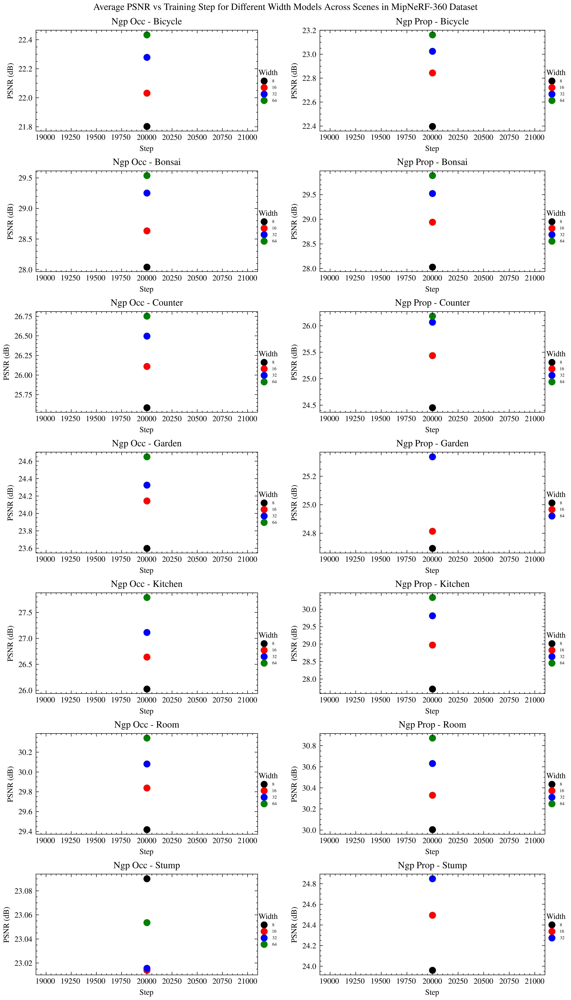

In [3]:
training_history_fp = "2uxektzo_xxjsfkbw_qfkjdvv2_hy03dx0e_wsxh6gjo_8ishbvau_b674pjcs_58hgroe5_all_results.csv"
df = pd.read_csv(training_history_fp)
df = df[df["sweep_name"].str.contains("head_depth")]
num_scenes = len(df["scene"].unique())
fig = plt.figure(layout="constrained", figsize=(8, 2 * num_scenes))
subfigs = fig.subfigures(1, 2, hspace=0.07)
for i, (model_type, model_group) in enumerate(df.groupby(by="model_type")):
    subfig = subfigs[i]
    axs = subfig.subplots(num_scenes, 1)
    for j, (scene, scene_group) in enumerate(model_group.groupby(by="scene")):
        ax = axs[j]
        for dim, dim_group in scene_group.groupby(by="hidden_dim"):
            psnr_col = f"Eval Results Summary/psnr_avg/elastic_{dim}"
            psnr_values = dim_group.loc[dim_group[psnr_col].notna(), psnr_col]
            steps = dim_group.loc[dim_group[psnr_col].notna(), "_step"]
            ax.scatter(
                steps,
                psnr_values,
                label=f"{dim}",
            )
        model_type_name = " ".join([m.capitalize() for m in model_type.split("_")])
        ax.set_title(f"{model_type_name} - {scene.capitalize()}")
        ax.set_xlabel("Step")
        ax.set_ylabel("PSNR (dB)")
        # ax.set_yscale("log")
        ax.legend(
            loc="upper right",
            bbox_to_anchor=(1.11, 0.65),
            fontsize="xx-small",
            fancybox=True,
            shadow=True,
            title="Width",
        )

fig.suptitle(
    "Average PSNR vs Training Step for Different Width Models Across Scenes in MipNeRF-360 Dataset"
)
plt.show()

/tmp/ipykernel_1565145/2858102654.py:2: DtypeWarning: Columns (117,221,222,223,224,225,227) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(training_history_fp)


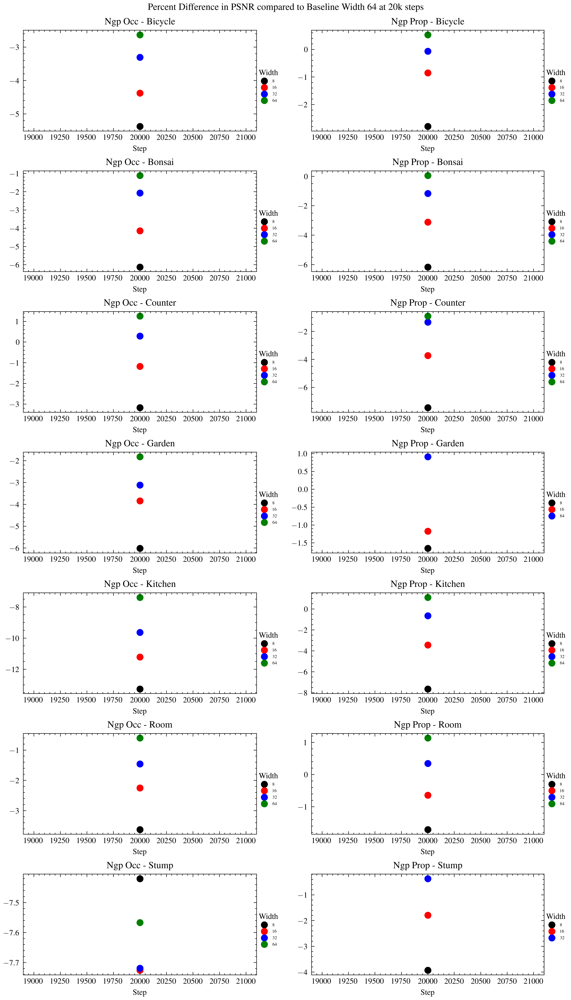

In [11]:
training_history_fp = "2uxektzo_xxjsfkbw_qfkjdvv2_hy03dx0e_wsxh6gjo_8ishbvau_b674pjcs_58hgroe5_all_results.csv"
df = pd.read_csv(training_history_fp)
df = df[df["sweep_name"].str.contains("head_depth")]
num_scenes = len(df["scene"].unique())
fig = plt.figure(layout="constrained", figsize=(8, 2 * num_scenes))
subfigs = fig.subfigures(1, 2, hspace=0.07)
for i, (model_type, model_group) in enumerate(df.groupby(by="model_type")):
    subfig = subfigs[i]
    axs = subfig.subplots(num_scenes, 1)
    for j, (scene, scene_group) in enumerate(model_group.groupby(by="scene")):
        ax = axs[j]
        # base_psnr = scene_group.query("_step == 20000 and hidden_dim == 64")[
        #     "Eval Results Summary/psnr_avg/elastic_64"
        # ].iloc[0]
        base_psnr = base_psnrs[scene]
        for dim, dim_group in scene_group.groupby(by="hidden_dim"):
            psnr_col = f"Eval Results Summary/psnr_avg/elastic_{dim}"
            psnr_values = np.array(dim_group.loc[dim_group[psnr_col].notna(), psnr_col])
            pc_increase = 100 * (psnr_values - base_psnr) / base_psnr
            steps = dim_group.loc[dim_group[psnr_col].notna(), "_step"]
            ax.scatter(
                steps,
                pc_increase,
                label=f"{dim}",
            )
        model_type_name = " ".join([m.capitalize() for m in model_type.split("_")])
        ax.set_title(f"{model_type_name} - {scene.capitalize()}")
        ax.set_xlabel("Step")
        ax.set_ylabel("% Diff")
        # ax.set_yscale("log")
        ax.legend(
            loc="upper right",
            bbox_to_anchor=(1.11, 0.65),
            fontsize="xx-small",
            fancybox=True,
            shadow=True,
            title="Width",
        )

fig.suptitle("Percent Difference in PSNR compared to Baseline Width 64 at 20k steps")
plt.show()

In [5]:
training_history_fp = "2uxektzo_xxjsfkbw_qfkjdvv2_hy03dx0e_wsxh6gjo_8ishbvau_b674pjcs_58hgroe5_all_results.csv"
df = pd.read_csv(training_history_fp)
df = df[~df["sweep_name"].str.contains("baseline")].query("_step == 20000")
cols_to_keep = ["_step", "sampling_strategy", "loss_weight_strategy", "num_widths_to_sample", "sweep_name", "model_type"]
cols_to_keep += [col for col in df.columns if "psnr_avg" in col]
df = df[cols_to_keep]
df

/tmp/ipykernel_1679852/2978706327.py:2: DtypeWarning: Columns (117,221,222,223,224,225,227) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(training_history_fp)


In [15]:
print(psnr_col)
dim_group

Eval Results Summary/psnr_avg/elastic_32


,Eval Results Summary/psnr_avg/elastic_16,Eval Results Summary/time_avg/elastic_16,Eval Results Summary/lpips_avg/elastic_16,Eval Results/n_rendering_samples/elastic_16,Train/max_depth/elastic_16,Eval Results/num_rays/elastic_16,Eval Results Summary/target_num_rays/elastic_16,Eval Results Summary/num_updates_skipped/elastic_16,Eval Results/target_num_rays/elastic_16,Train/target_num_rays/elastic_16,...,density_field._target,density_field.use_elastic,density-field.use-elastic,sampling-strategy,loss-weight-strategy,normalize-loss-weights,use_elastic_lr,use_elastic_loss,radiance-field.head-depth,adjust_lr_for_duplicate_train_batch


In [16]:
model_group

,Eval Results Summary/psnr_avg/elastic_16,Eval Results Summary/time_avg/elastic_16,Eval Results Summary/lpips_avg/elastic_16,Eval Results/n_rendering_samples/elastic_16,Train/max_depth/elastic_16,Eval Results/num_rays/elastic_16,Eval Results Summary/target_num_rays/elastic_16,Eval Results Summary/num_updates_skipped/elastic_16,Eval Results/target_num_rays/elastic_16,Train/target_num_rays/elastic_16,...,density_field._target,density_field.use_elastic,density-field.use-elastic,sampling-strategy,loss-weight-strategy,normalize-loss-weights,use_elastic_lr,use_elastic_loss,radiance-field.head-depth,adjust_lr_for_duplicate_train_batch
10039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,elastic_nerf.nerfacc.radiance_fields.ngp.NGPDe...,False,False,NaN,NaN,NaN,False,False,1.0,False
10139,24.814502,0.822551,0.327694,NaN,NaN,840.0,0.0,0.0,0.0,NaN,...,elastic_nerf.nerfacc.radiance_fields.ngp.NGPDe...,False,False,NaN,NaN,NaN,False,False,1.0,False
10159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,elastic_nerf.nerfacc.radiance_fields.ngp.NGPDe...,False,False,NaN,NaN,NaN,False,False,1.0,False
